### Problem Statement

In [1]:
import pandas as pd
# Load the datasets
labels_df = pd.read_csv("train_labels.csv")
values_df = pd.read_csv("train_values.csv")

# Merge the datasets on 'patient_id'
data = pd.merge(values_df, labels_df, on="building_id", how="inner")

# Save the merged dataset to a new CSV file
data.to_csv("merged.csv", index=False)

In [2]:
data

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,802906,6,487,12198,2,30,6,5,t,r,...,0,0,0,0,0,0,0,0,0,3
1,28830,8,900,2812,2,10,8,7,o,r,...,0,0,0,0,0,0,0,0,0,2
2,94947,21,363,8973,2,10,5,5,t,r,...,0,0,0,0,0,0,0,0,0,3
3,590882,22,418,10694,2,10,6,5,t,r,...,0,0,0,0,0,0,0,0,0,2
4,201944,11,131,1488,3,30,8,9,t,r,...,0,0,0,0,0,0,0,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
260596,688636,25,1335,1621,1,55,6,3,n,r,...,0,0,0,0,0,0,0,0,0,2
260597,669485,17,715,2060,2,0,6,5,t,r,...,0,0,0,0,0,0,0,0,0,3
260598,602512,17,51,8163,3,55,6,7,t,r,...,0,0,0,0,0,0,0,0,0,3
260599,151409,26,39,1851,2,10,14,6,t,r,...,0,0,0,0,0,0,0,0,0,2


### Task 1:-Prepare a complete data analysis report on the given data.

In [6]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

### Domain Analysis

In [9]:
data.columns

Index(['building_id', 'geo_level_1_id', 'geo_level_2_id', 'geo_level_3_id',
       'count_floors_pre_eq', 'age', 'area_percentage', 'height_percentage',
       'land_surface_condition', 'foundation_type', 'roof_type',
       'ground_floor_type', 'other_floor_type', 'position',
       'plan_configuration', 'has_superstructure_adobe_mud',
       'has_superstructure_mud_mortar_stone', 'has_superstructure_stone_flag',
       'has_superstructure_cement_mortar_stone',
       'has_superstructure_mud_mortar_brick',
       'has_superstructure_cement_mortar_brick', 'has_superstructure_timber',
       'has_superstructure_bamboo', 'has_superstructure_rc_non_engineered',
       'has_superstructure_rc_engineered', 'has_superstructure_other',
       'legal_ownership_status', 'count_families', 'has_secondary_use',
       'has_secondary_use_agriculture', 'has_secondary_use_hotel',
       'has_secondary_use_rental', 'has_secondary_use_institution',
       'has_secondary_use_school', 'has_secondary_use_i

### Basic Checks

In [12]:
data.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,802906,6,487,12198,2,30,6,5,t,r,...,0,0,0,0,0,0,0,0,0,3
1,28830,8,900,2812,2,10,8,7,o,r,...,0,0,0,0,0,0,0,0,0,2
2,94947,21,363,8973,2,10,5,5,t,r,...,0,0,0,0,0,0,0,0,0,3
3,590882,22,418,10694,2,10,6,5,t,r,...,0,0,0,0,0,0,0,0,0,2
4,201944,11,131,1488,3,30,8,9,t,r,...,0,0,0,0,0,0,0,0,0,3


In [14]:
data.tail()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
260596,688636,25,1335,1621,1,55,6,3,n,r,...,0,0,0,0,0,0,0,0,0,2
260597,669485,17,715,2060,2,0,6,5,t,r,...,0,0,0,0,0,0,0,0,0,3
260598,602512,17,51,8163,3,55,6,7,t,r,...,0,0,0,0,0,0,0,0,0,3
260599,151409,26,39,1851,2,10,14,6,t,r,...,0,0,0,0,0,0,0,0,0,2
260600,747594,21,9,9101,3,10,7,6,n,r,...,0,0,0,0,0,0,0,0,0,3


In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 260601 entries, 0 to 260600
Data columns (total 40 columns):
 #   Column                                  Non-Null Count   Dtype 
---  ------                                  --------------   ----- 
 0   building_id                             260601 non-null  int64 
 1   geo_level_1_id                          260601 non-null  int64 
 2   geo_level_2_id                          260601 non-null  int64 
 3   geo_level_3_id                          260601 non-null  int64 
 4   count_floors_pre_eq                     260601 non-null  int64 
 5   age                                     260601 non-null  int64 
 6   area_percentage                         260601 non-null  int64 
 7   height_percentage                       260601 non-null  int64 
 8   land_surface_condition                  260601 non-null  object
 9   foundation_type                         260601 non-null  object
 10  roof_type                               260601 non-null 

In [18]:
data.describe()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,...,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
count,2.606010e+05,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,...,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000
mean,5.256755e+05,13.900353,701.074685,6257.876148,2.129723,26.535029,8.018051,5.434365,0.088645,0.761935,...,0.033626,0.008101,0.000940,0.000361,0.001071,0.000188,0.000146,0.000088,0.005119,2.238272
std,3.045450e+05,8.033617,412.710734,3646.369645,0.727665,73.565937,4.392231,1.918418,0.284231,0.425900,...,0.180265,0.089638,0.030647,0.018989,0.032703,0.013711,0.012075,0.009394,0.071364,0.611814
min,4.000000e+00,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,2.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2.611900e+05,7.000000,350.000000,3073.000000,2.000000,10.000000,5.000000,4.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,5.257570e+05,12.000000,702.000000,6270.000000,2.000000,15.000000,7.000000,5.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,7.897620e+05,21.000000,1050.000000,9412.000000,2.000000,30.000000,9.000000,6.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,1.052934e+06,30.000000,1427.000000,12567.000000,9.000000,995.000000,100.000000,32.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000


In [19]:
data.describe(include="O")

,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,legal_ownership_status
count,260601,260601,260601,260601,260601,260601,260601,260601
unique,3,5,3,5,4,4,10,4
top,t,r,n,f,q,s,d,v
freq,216757,219196,182842,209619,165282,202090,250072,250939


In [21]:
duplicate_rows = data[data.duplicated()]
print(duplicate_rows)

Empty DataFrame
Columns: [building_id, geo_level_1_id, geo_level_2_id, geo_level_3_id, count_floors_pre_eq, age, area_percentage, height_percentage, land_surface_condition, foundation_type, roof_type, ground_floor_type, other_floor_type, position, plan_configuration, has_superstructure_adobe_mud, has_superstructure_mud_mortar_stone, has_superstructure_stone_flag, has_superstructure_cement_mortar_stone, has_superstructure_mud_mortar_brick, has_superstructure_cement_mortar_brick, has_superstructure_timber, has_superstructure_bamboo, has_superstructure_rc_non_engineered, has_superstructure_rc_engineered, has_superstructure_other, legal_ownership_status, count_families, has_secondary_use, has_secondary_use_agriculture, has_secondary_use_hotel, has_secondary_use_rental, has_secondary_use_institution, has_secondary_use_school, has_secondary_use_industry, has_secondary_use_health_post, has_secondary_use_gov_office, has_secondary_use_use_police, has_secondary_use_other, damage_grade]
Index: []

### Data Preprocessing

In [25]:
data.isnull().sum()

building_id                               0
geo_level_1_id                            0
geo_level_2_id                            0
geo_level_3_id                            0
count_floors_pre_eq                       0
age                                       0
area_percentage                           0
height_percentage                         0
land_surface_condition                    0
foundation_type                           0
roof_type                                 0
ground_floor_type                         0
other_floor_type                          0
position                                  0
plan_configuration                        0
has_superstructure_adobe_mud              0
has_superstructure_mud_mortar_stone       0
has_superstructure_stone_flag             0
has_superstructure_cement_mortar_stone    0
has_superstructure_mud_mortar_brick       0
has_superstructure_cement_mortar_brick    0
has_superstructure_timber                 0
has_superstructure_bamboo       

In [26]:
'''dropping building_id column 
The building_id column is a unique identifier for each building, but it does not contain any relevant information 
that can help predict building damage, so we are dropping this'''
data=data.drop('building_id',axis=1) 

In [29]:
data

,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,...,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,6,487,12198,2,30,6,5,t,r,n,...,0,0,0,0,0,0,0,0,0,3
1,8,900,2812,2,10,8,7,o,r,n,...,0,0,0,0,0,0,0,0,0,2
2,21,363,8973,2,10,5,5,t,r,n,...,0,0,0,0,0,0,0,0,0,3
3,22,418,10694,2,10,6,5,t,r,n,...,0,0,0,0,0,0,0,0,0,2
4,11,131,1488,3,30,8,9,t,r,n,...,0,0,0,0,0,0,0,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
260596,25,1335,1621,1,55,6,3,n,r,n,...,0,0,0,0,0,0,0,0,0,2
260597,17,715,2060,2,0,6,5,t,r,n,...,0,0,0,0,0,0,0,0,0,3
260598,17,51,8163,3,55,6,7,t,r,q,...,0,0,0,0,0,0,0,0,0,3
260599,26,39,1851,2,10,14,6,t,r,x,...,0,0,0,0,0,0,0,0,0,2


In [31]:
#firstly seperating the numerical data and categorical data
numerical_cols = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_cols = data.select_dtypes(include=['object']).columns.tolist()

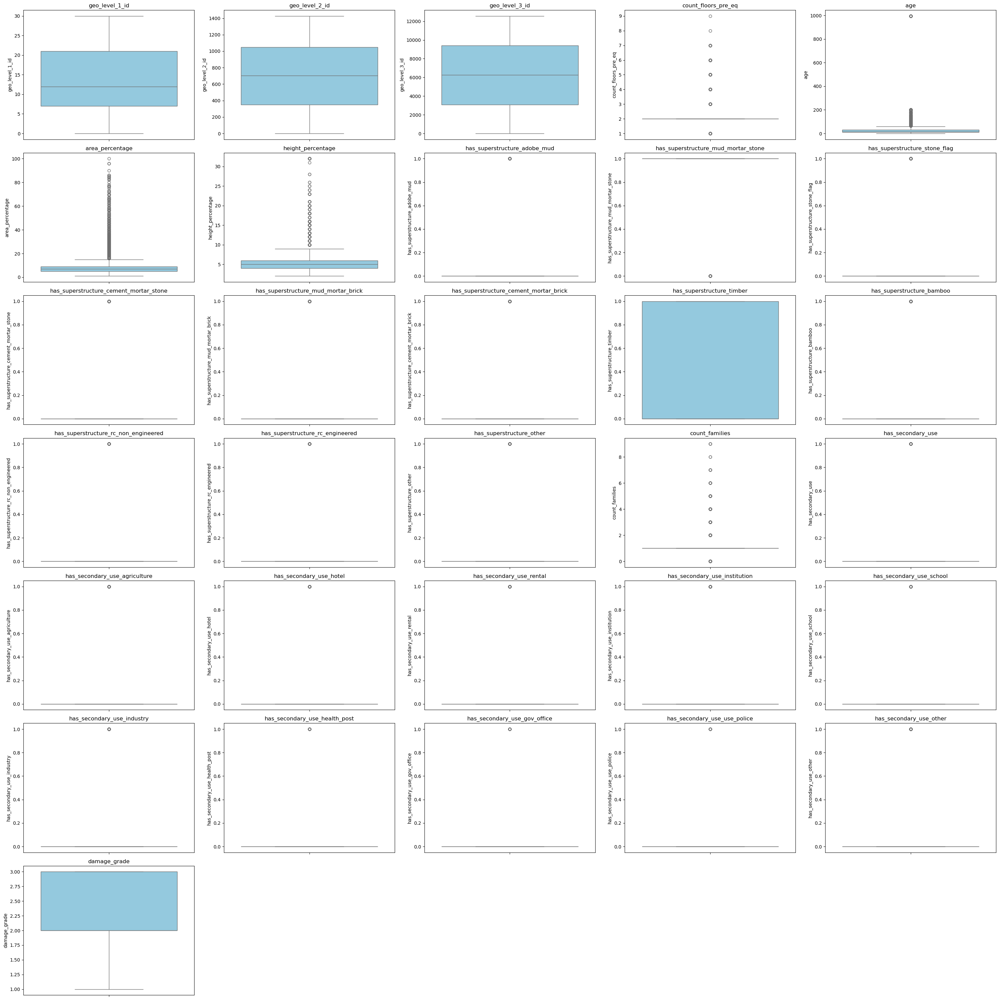

In [33]:
#Finding Outliers
plt.figure(figsize=(30, 30))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot((len(numerical_cols) // 5) + 1, 5, i)
    sns.boxplot(y=data[col], color="skyblue")
    plt.title(col)
plt.tight_layout()
plt.show()

In [34]:
from scipy.stats import zscore
numerical_cols.remove('damage_grade')  # Exclude target variable

# Function to count outliers using Z-score method
def count_outliers_zscore(df, columns, threshold=3):
    outlier_dict = {}
    for col in columns:
        z_scores = zscore(df[col])  # Compute Z-scores
        outliers = df[(abs(z_scores) > threshold)]  # Count values > threshold
        outlier_dict[col] = len(outliers)
    return outlier_dict

# Count outliers in each numerical column (excluding TARGET)
outliers_found = count_outliers_zscore(data, numerical_cols)

# Print count of outliers per column
print("Outlier Count Per Column (Excluding TARGET):")
print(outliers_found)

Outlier Count Per Column (Excluding TARGET):
{'geo_level_1_id': 0, 'geo_level_2_id': 0, 'geo_level_3_id': 0, 'count_floors_pre_eq': 2496, 'age': 1390, 'area_percentage': 3845, 'height_percentage': 2434, 'has_superstructure_adobe_mud': 23101, 'has_superstructure_mud_mortar_stone': 0, 'has_superstructure_stone_flag': 8947, 'has_superstructure_cement_mortar_stone': 4752, 'has_superstructure_mud_mortar_brick': 17761, 'has_superstructure_cement_mortar_brick': 19615, 'has_superstructure_timber': 0, 'has_superstructure_bamboo': 22154, 'has_superstructure_rc_non_engineered': 11099, 'has_superstructure_rc_engineered': 4133, 'has_superstructure_other': 3905, 'count_families': 2330, 'has_secondary_use': 0, 'has_secondary_use_agriculture': 16777, 'has_secondary_use_hotel': 8763, 'has_secondary_use_rental': 2111, 'has_secondary_use_institution': 245, 'has_secondary_use_school': 94, 'has_secondary_use_industry': 279, 'has_secondary_use_health_post': 49, 'has_secondary_use_gov_office': 38, 'has_secon

In [35]:
from scipy.stats.mstats import winsorize

# Columns for outlier handling
winsorize_cols = ['count_floors_pre_eq', 'area_percentage', 'height_percentage', 'count_families']

# Apply Winsorization (Capping at 1st and 99th percentile)
for col in winsorize_cols:
    data[col] = winsorize(data[col], limits=[0.01, 0.01])  # Capping at 1st & 99th percentile

# Print dataset shape after outlier handling
print("Dataset shape after Winsorization:", data.shape)

Dataset shape after Winsorization: (260601, 39)


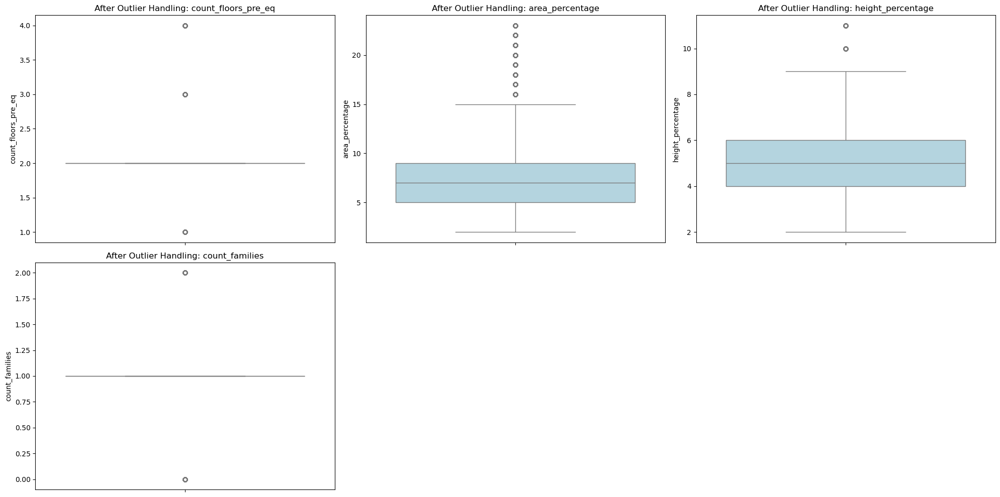

In [36]:
#Checking whether outliers are handled or not
plt.figure(figsize=(20, 10))
for i, col in enumerate(winsorize_cols, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(y=data[col], color="lightblue")
    plt.title(f"After Outlier Handling: {col}")
plt.tight_layout()
plt.show()

### EDA

In [38]:
from ydata_profiling import ProfileReport

In [39]:
profile=ProfileReport(data,title="EDA",explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

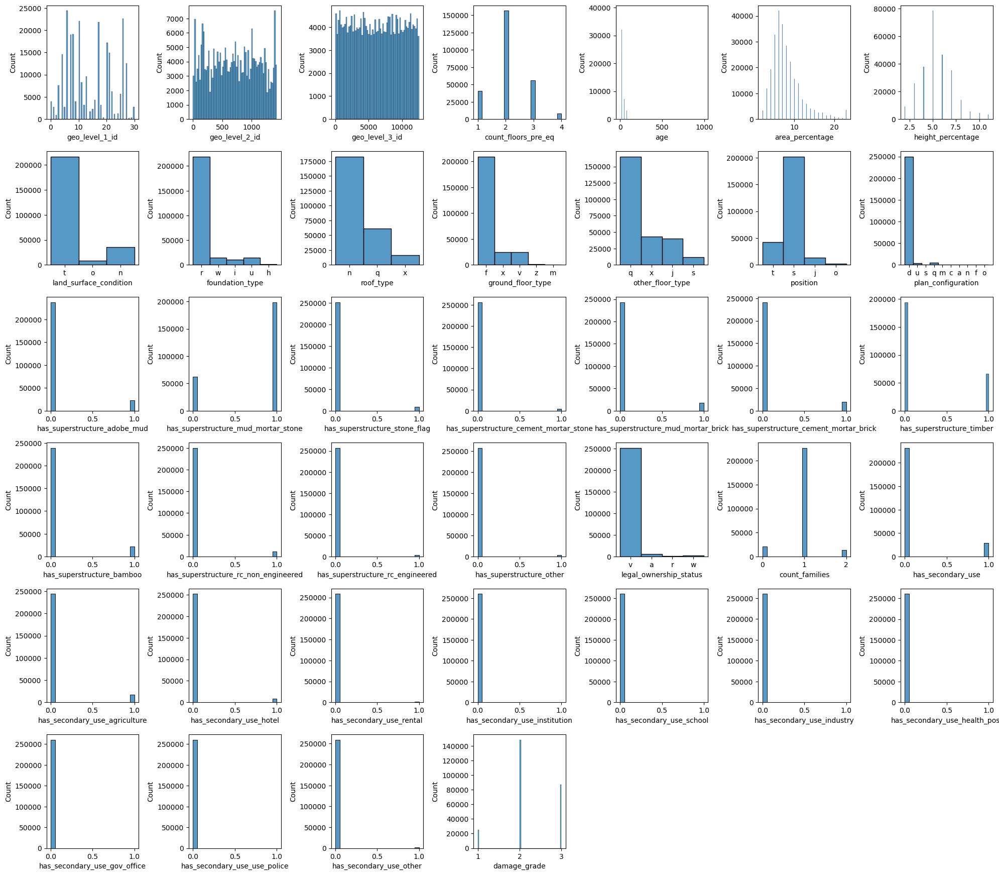

In [46]:
#Univariate analysis
import math
# Calculate the grid size dynamically
grid_size = math.ceil(math.sqrt(len(data.columns)))  # Square root of column count, rounded up

plt.figure(figsize=(20, 20))
plotnum = 1
for column in data:
    plt.subplot(grid_size, grid_size, plotnum)  # Updated grid size
    sns.histplot(data[column])
    plotnum += 1
plt.tight_layout()
plt.show()

In [47]:
# Separating categorical and numerical columns
categorical_data = data.select_dtypes(include=['object'])  # Selecting categorical features
numerical_data = data.select_dtypes(include=['int64', 'float64'])  # Selecting numerical features

# Display the number of columns in each category
print("Categorical Columns:", categorical_data.columns.tolist())
print("Numerical Columns:", numerical_data.columns.tolist())

Categorical Columns: ['land_surface_condition', 'foundation_type', 'roof_type', 'ground_floor_type', 'other_floor_type', 'position', 'plan_configuration', 'legal_ownership_status']
Numerical Columns: ['geo_level_1_id', 'geo_level_2_id', 'geo_level_3_id', 'count_floors_pre_eq', 'age', 'area_percentage', 'height_percentage', 'has_superstructure_adobe_mud', 'has_superstructure_mud_mortar_stone', 'has_superstructure_stone_flag', 'has_superstructure_cement_mortar_stone', 'has_superstructure_mud_mortar_brick', 'has_superstructure_cement_mortar_brick', 'has_superstructure_timber', 'has_superstructure_bamboo', 'has_superstructure_rc_non_engineered', 'has_superstructure_rc_engineered', 'has_superstructure_other', 'count_families', 'has_secondary_use', 'has_secondary_use_agriculture', 'has_secondary_use_hotel', 'has_secondary_use_rental', 'has_secondary_use_institution', 'has_secondary_use_school', 'has_secondary_use_industry', 'has_secondary_use_health_post', 'has_secondary_use_gov_office', 'ha

In [48]:
# Separating categorical and numerical features
data1 = data[['land_surface_condition', 'foundation_type', 'roof_type', 'ground_floor_type',
              'other_floor_type','position', 'plan_configuration', 'legal_ownership_status']]

data2= data[['geo_level_1_id', 'geo_level_2_id', 'geo_level_3_id', 'count_floors_pre_eq', 'age', 'area_percentage', 
             'height_percentage', 'has_superstructure_adobe_mud', 'has_superstructure_mud_mortar_stone', 
             'has_superstructure_stone_flag', 'has_superstructure_cement_mortar_stone',
             'has_superstructure_mud_mortar_brick', 'has_superstructure_cement_mortar_brick', 
             'has_superstructure_timber', 'has_superstructure_bamboo', 'has_superstructure_rc_non_engineered',
             'has_superstructure_rc_engineered', 'has_superstructure_other', 'count_families', 'has_secondary_use', 
             'has_secondary_use_agriculture', 'has_secondary_use_hotel', 'has_secondary_use_rental', 
             'has_secondary_use_institution', 'has_secondary_use_school', 'has_secondary_use_industry', 
             'has_secondary_use_health_post', 'has_secondary_use_gov_office',
             'has_secondary_use_use_police', 'has_secondary_use_other', 'damage_grade']]
# Here data1 contains categorical features and data2 contains numerical features

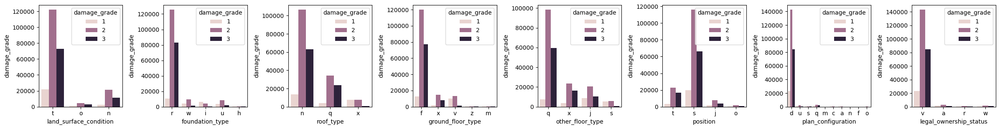

In [52]:
#analyzing data1 with our target variable 'damage_grade'
plt.figure(figsize=(30,30),facecolor='white') 
plotnumber = 1 
for column in data1:
    if plotnumber<=20:   
        ax=plt.subplot(10,10,plotnumber)
        sns.countplot(x=data1[column], hue=data['damage_grade'])
        plt.xlabel(column,fontsize=10) 
        plt.ylabel('damage_grade',fontsize=10)
    plotnumber+=1
plt.tight_layout()
plt.show()

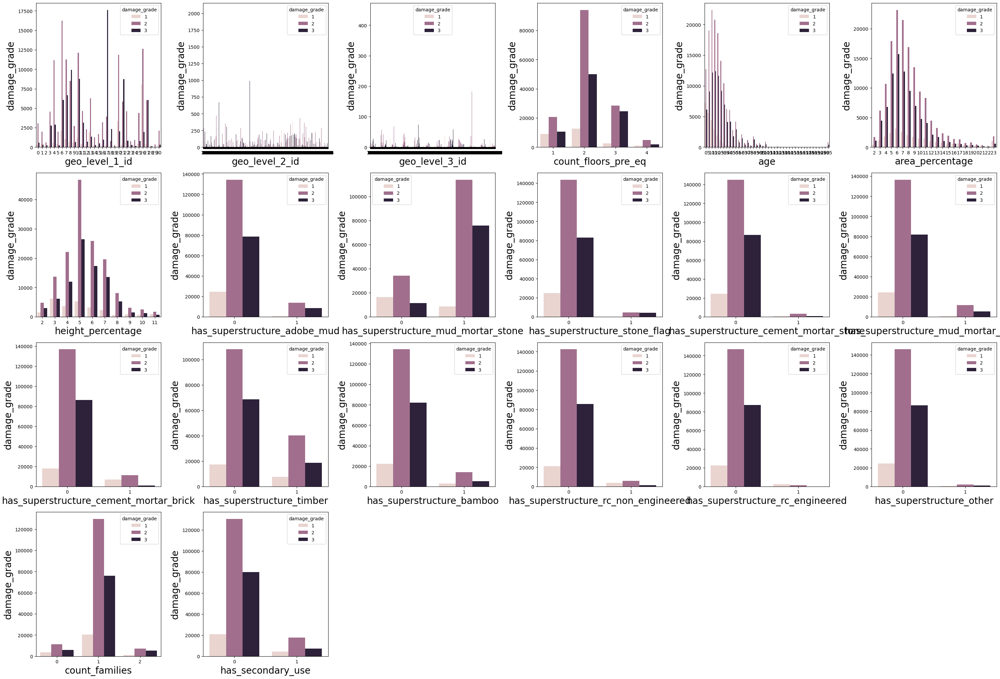

In [53]:
#analyzing data2 with our target variable 'damage_grade'
plt.figure(figsize=(30,30),facecolor='white') 
plotnumber = 1 
for column in data2:
    if plotnumber<=20:   
        ax=plt.subplot(6,6,plotnumber)
        sns.countplot(x=data2[column],hue=data['damage_grade'])
        plt.xlabel(column,fontsize=20) 
        plt.ylabel('damage_grade',fontsize=20)
    plotnumber+=1
plt.tight_layout()
plt.show()

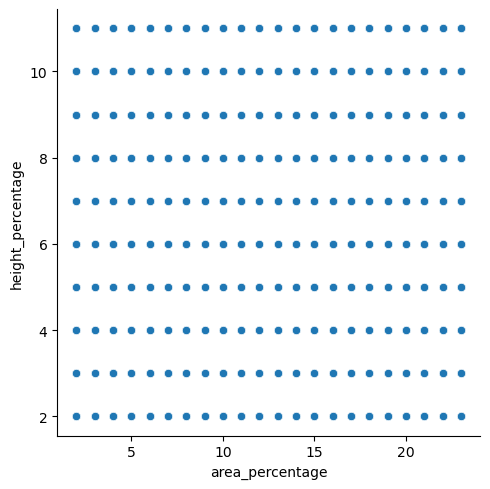

In [55]:
#Analyzing the relationships between input attributes
#`area_percentage` vs. `height_percentage`
#Whether building footprint influences height
sns.relplot(x='area_percentage',y='height_percentage',data=data)
plt.show()

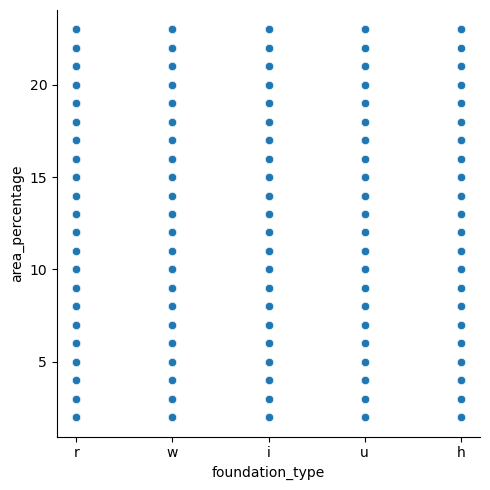

In [58]:
#foundation_type vs. area_percentage
#if certain foundations support larger buildings
sns.relplot(x='foundation_type',y='area_percentage',data=data)
plt.show()

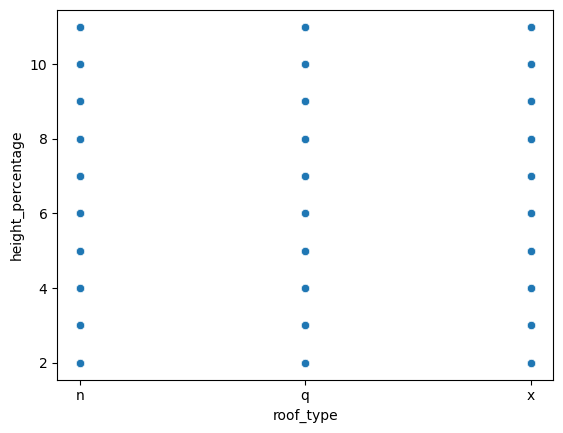

In [59]:
#roof_type vs. height_percentage
#Roof types might affect building height.
sns.scatterplot(x='roof_type',y='height_percentage',data=data)
plt.show()

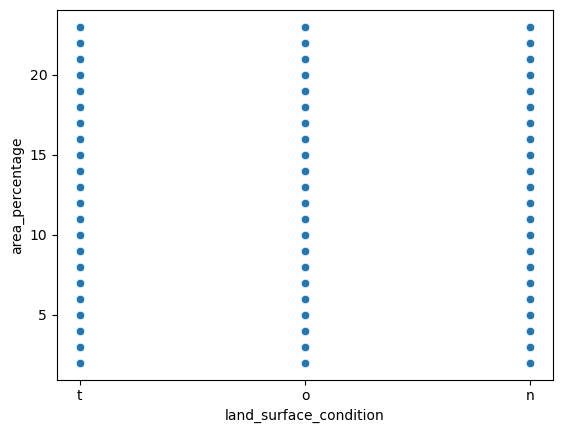

In [61]:
#land_surface_condition vs. area_percentage
# Land condition might impact building area.
sns.scatterplot(x='land_surface_condition',y='area_percentage',data=data)
plt.show()

In [64]:
#Multii variate analysis
sns.pairplot(data=data)
plt.show()

### Feature Engineering

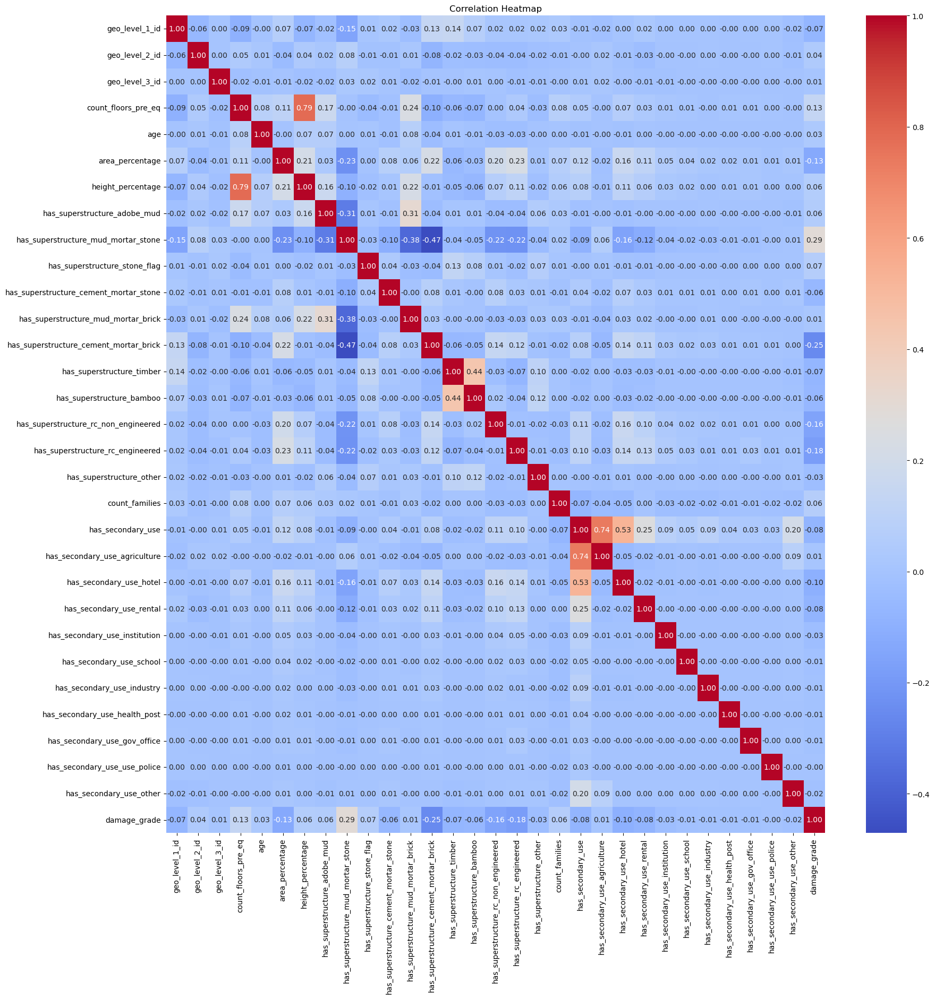

In [45]:
# Calculate the correlation matrix
corr_matrix = data2.corr()
# Plot the heatmap
plt.figure(figsize=(20,20))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Heatmap")
plt.show()

In [46]:
#Find Correlations with the Target
target_corr = corr_matrix['damage_grade'].sort_values(ascending=False)
print("Correlations with target variable 'damage_grade':")
print(target_corr)

Correlations with target variable 'damage_grade':
damage_grade                              1.000000
has_superstructure_mud_mortar_stone       0.291325
count_floors_pre_eq                       0.133459
has_superstructure_stone_flag             0.066039
count_families                            0.064890
height_percentage                         0.057835
has_superstructure_adobe_mud              0.055314
geo_level_2_id                            0.043161
age                                       0.029273
has_superstructure_mud_mortar_brick       0.014561
has_secondary_use_agriculture             0.011309
geo_level_3_id                            0.007932
has_secondary_use_use_police             -0.001656
has_secondary_use_health_post            -0.008543
has_secondary_use_gov_office             -0.009378
has_secondary_use_industry               -0.011024
has_secondary_use_school                 -0.011692
has_secondary_use_other                  -0.016334
has_secondary_use_institution   

In [47]:
# Find pairs with correlation > 0.8
high_corr = corr_matrix.abs().unstack().sort_values(ascending=False)
high_corr = high_corr[high_corr >= 0.8]  # Threshold for strong correlation
print("Highly correlated feature pairs:")
print(high_corr)

Highly correlated feature pairs:
geo_level_1_id                          geo_level_1_id                            1.0
has_superstructure_rc_engineered        has_superstructure_rc_engineered          1.0
count_floors_pre_eq                     count_floors_pre_eq                       1.0
age                                     age                                       1.0
area_percentage                         area_percentage                           1.0
height_percentage                       height_percentage                         1.0
has_superstructure_adobe_mud            has_superstructure_adobe_mud              1.0
has_superstructure_mud_mortar_stone     has_superstructure_mud_mortar_stone       1.0
has_superstructure_stone_flag           has_superstructure_stone_flag             1.0
has_superstructure_cement_mortar_stone  has_superstructure_cement_mortar_stone    1.0
has_superstructure_mud_mortar_brick     has_superstructure_mud_mortar_brick       1.0
has_superstructure_ce

In [48]:
# List of columns to drop based on correlation analysis
columns_to_drop = [
    'geo_level_3_id', 'geo_level_1_id', 'has_superstructure_stone_flag', 
    'has_superstructure_cement_mortar_stone', 'has_superstructure_mud_mortar_brick', 
    'has_superstructure_other', 'has_superstructure_bamboo', 
    'has_secondary_use', 'has_secondary_use_institution', 'has_secondary_use_industry', 
    'has_secondary_use_health_post', 'has_secondary_use_use_police', 
    'has_secondary_use_gov_office', 'has_secondary_use_school', 
    'has_secondary_use_other', 'has_superstructure_timber'
]

# Drop the columns from the DataFrame
data = data.drop(columns=columns_to_drop, axis=1)

In [49]:
data  #checking whether dropped or not

,geo_level_2_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,...,has_superstructure_mud_mortar_stone,has_superstructure_cement_mortar_brick,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,legal_ownership_status,count_families,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,damage_grade
0,487,2,30,6,5,t,r,n,f,q,...,1,0,0,0,v,1,0,0,0,3
1,900,2,10,8,7,o,r,n,x,q,...,1,0,0,0,v,1,0,0,0,2
2,363,2,10,5,5,t,r,n,f,x,...,1,0,0,0,v,1,0,0,0,3
3,418,2,10,6,5,t,r,n,f,x,...,1,0,0,0,v,1,0,0,0,2
4,131,3,30,8,9,t,r,n,f,x,...,0,0,0,0,v,1,0,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
260596,1335,1,55,6,3,n,r,n,f,j,...,1,0,0,0,v,1,0,0,0,2
260597,715,2,0,6,5,t,r,n,f,q,...,1,0,0,0,v,1,0,0,0,3
260598,51,3,55,6,7,t,r,q,f,q,...,1,0,0,0,v,1,0,0,0,3
260599,39,2,10,14,6,t,r,x,v,s,...,0,1,0,0,v,1,0,0,0,2


In [55]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import StandardScaler,LabelEncoder,OneHotEncoder,OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
import pickle
from sklearn.pipeline import Pipeline

In [57]:
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler()

In [59]:
#The columns are given to the encoders and scalers accordingly
standard_scaler = ['geo_level_2_id','has_secondary_use_agriculture','has_secondary_use_hotel',
                   'has_secondary_use_rental']
minmax_scaler = ['count_floors_pre_eq','age','area_percentage','height_percentage','count_families']
frequency_encoder = ['foundation_type', 'ground_floor_type', 'plan_configuration','legal_ownership_status']
ordinal_encoder = ['position']
label_encoder = ['land_surface_condition','roof_type','other_floor_type']
passthrough = ['has_superstructure_adobe_mud','has_superstructure_mud_mortar_stone','has_superstructure_cement_mortar_brick','has_superstructure_rc_non_engineered',
               'has_superstructure_rc_engineered']

In [61]:
#code to do label encoding
class ModifiedLabelEncoder(LabelEncoder):
    def fit_transform(self, y, *args, **kwargs):
        return super().fit_transform(y).reshape(-1, 1)
    def transform(self, y, *args, **kwargs):
        return super().transform(y).reshape(-1, 1)

In [63]:
#code to do frequency encoding
from sklearn.base import BaseEstimator, TransformerMixin

class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns
        self.mappings = {}

    def fit(self, X, y=None):
        # Store frequency encoding for each column
        for column in self.columns:
            value_counts = X[column].value_counts()
            sorted_values = sorted(value_counts.items(), key=lambda x: x[1])
            self.mappings[column] = {value: idx for idx, (value, _) in enumerate(sorted_values)}
        return self

    def transform(self, X):
        X_encoded = X.copy()
        for column in self.columns:
            X_encoded[column] = X_encoded[column].map(self.mappings[column])
        return X_encoded


In [65]:
#code for Ordinal Encoder
from sklearn.preprocessing import OrdinalEncoder
class CustomOrdinalEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, column, categories):
        self.column = column
        self.categories = categories  # Define the specific order
        self.encoder = OrdinalEncoder(categories=[categories], handle_unknown="use_encoded_value", unknown_value=-1)
    def fit(self, X, y=None):
        self.encoder.fit(X[[self.column]])  # Fit on the specified column
        return self
    def transform(self, X):
        X_encoded = X.copy()
        X_encoded[self.column] = self.encoder.transform(X_encoded[[self.column]]).astype(int)  # Apply encoding
        return X_encoded

In [67]:
def same(x):
    return x

In [69]:
no_trans=FunctionTransformer(same)

In [71]:
# Define the column transformer with all encoders and scalers
preprocessor = ColumnTransformer([
    ("Standard_scaler", StandardScaler(), standard_scaler), 
    ("MinMax_scaler", MinMaxScaler(), minmax_scaler),
    ("Ordinal_encoder", OrdinalEncoder(), ordinal_encoder),  
    ("Label_encoder", OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=-1), label_encoder),  
    ("Frequency_encoder", FrequencyEncoder(frequency_encoder), frequency_encoder),  # Fixed frequency encoding
    ("Pass_through", 'passthrough', passthrough)  
])

In [73]:
# Fit and transform the data
transformed_data = preprocessor.fit_transform(data)
# Print transformed data
print("Transformed data shape:", transformed_data.shape)
print("Preview of transformed data:")
print(transformed_data[:5])

Transformed data shape: (260601, 22)
Preview of transformed data:
[[-0.51870494 -0.26231246 -0.18653734 -0.09036958  0.33333333  0.03015075
   0.19047619  0.33333333  0.5         3.          2.          0.
   1.          4.          4.          9.          3.          1.
   1.          0.          0.          0.        ]
 [ 0.48199788 -0.26231246 -0.18653734 -0.09036958  0.33333333  0.01005025
   0.28571429  0.55555556  0.5         2.          1.          0.
   1.          4.          3.          9.          3.          0.
   1.          0.          0.          0.        ]
 [-0.81915808 -0.26231246 -0.18653734 -0.09036958  0.33333333  0.01005025
   0.14285714  0.33333333  0.5         3.          2.          0.
   3.          4.          4.          9.          3.          0.
   1.          0.          0.          0.        ]
 [-0.68589258 -0.26231246 -0.18653734 -0.09036958  0.33333333  0.01005025
   0.19047619  0.33333333  0.5         2.          2.          0.
   3.          4.      

In [74]:
preprocessor

ColumnTransformer(transformers=[('Standard_scaler', StandardScaler(),
                                 ['geo_level_2_id',
                                  'has_secondary_use_agriculture',
                                  'has_secondary_use_hotel',
                                  'has_secondary_use_rental']),
                                ('MinMax_scaler', MinMaxScaler(),
                                 ['count_floors_pre_eq', 'age',
                                  'area_percentage', 'height_percentage',
                                  'count_families']),
                                ('Ordinal_encoder', OrdinalEncoder(),
                                 ['position']),
                                ('Label_e...
                                                           'plan_configuration',
                                                           'legal_ownership_status']),
                                 ['foundation_type', 'ground_floor_type',
                                  'plan_configuration',
                                  'legal_ownership_status']),
                                ('Pass_through', 'passthrough',
                                 ['has_superstructure_adobe_mud',
                                  'has_superstructure_mud_mortar_stone',
                                  'has_superstructure_cement_mortar_brick',
                                  'has_superstructure_rc_non_engineered',
                                  'has_superstructure_rc_engineered'])])

In [77]:
# Fit and transform the data using the preprocessor
transformed_data = preprocessor.fit_transform(data)
# Print the transformed data
print(transformed_data)

[[-0.51870494 -0.26231246 -0.18653734 ...  0.          0.
   0.        ]
 [ 0.48199788 -0.26231246 -0.18653734 ...  0.          0.
   0.        ]
 [-0.81915808 -0.26231246 -0.18653734 ...  0.          0.
   0.        ]
 ...
 [-1.57513697 -0.26231246 -0.18653734 ...  0.          0.
   0.        ]
 [-1.60421308 -0.26231246 -0.18653734 ...  1.          0.
   0.        ]
 [-1.67690335 -0.26231246 -0.18653734 ...  0.          0.
   0.        ]]


In [78]:
for name, transformer, columns in preprocessor.transformers_:
    print(f"Transformer: {name}, Columns: {columns}")

Transformer: Standard_scaler, Columns: ['geo_level_2_id', 'has_secondary_use_agriculture', 'has_secondary_use_hotel', 'has_secondary_use_rental']
Transformer: MinMax_scaler, Columns: ['count_floors_pre_eq', 'age', 'area_percentage', 'height_percentage', 'count_families']
Transformer: Ordinal_encoder, Columns: ['position']
Transformer: Label_encoder, Columns: ['land_surface_condition', 'roof_type', 'other_floor_type']
Transformer: Frequency_encoder, Columns: ['foundation_type', 'ground_floor_type', 'plan_configuration', 'legal_ownership_status']
Transformer: Pass_through, Columns: ['has_superstructure_adobe_mud', 'has_superstructure_mud_mortar_stone', 'has_superstructure_cement_mortar_brick', 'has_superstructure_rc_non_engineered', 'has_superstructure_rc_engineered']
Transformer: remainder, Columns: [22]


In [81]:
# Print a preview of the transformed data
print("Preview of transformed data:")
print(transformed_data[:5])  # Show first 5 rows
# Check data type of transformed_data
if isinstance(transformed_data, np.ndarray):
    print("Data is encoded: Transformed data is a NumPy array.")
else:
    print("Data is not properly encoded.")
# Verify specific transformations
for name, transformer, columns in preprocessor.transformers_:
    print(f"Transformer: {name}, Applied on Columns: {columns}")

Preview of transformed data:
[[-0.51870494 -0.26231246 -0.18653734 -0.09036958  0.33333333  0.03015075
   0.19047619  0.33333333  0.5         3.          2.          0.
   1.          4.          4.          9.          3.          1.
   1.          0.          0.          0.        ]
 [ 0.48199788 -0.26231246 -0.18653734 -0.09036958  0.33333333  0.01005025
   0.28571429  0.55555556  0.5         2.          1.          0.
   1.          4.          3.          9.          3.          0.
   1.          0.          0.          0.        ]
 [-0.81915808 -0.26231246 -0.18653734 -0.09036958  0.33333333  0.01005025
   0.14285714  0.33333333  0.5         3.          2.          0.
   3.          4.          4.          9.          3.          0.
   1.          0.          0.          0.        ]
 [-0.68589258 -0.26231246 -0.18653734 -0.09036958  0.33333333  0.01005025
   0.19047619  0.33333333  0.5         2.          2.          0.
   3.          4.          4.          9.          3.       

In [83]:
import pickle   # For saving and loading machine learning models
from sklearn.model_selection import train_test_split  # For splitting the data into training and testing
from preprocessor import *  # To import all preprocessor functions at once
from imblearn.over_sampling import SMOTE  # For balancing the data
import warnings

### Task 2:- Create a predictive model in such a way that the objective is to predict the ordinal variable “damage_grade”. This column presents the level of damage grade affected by the earthquake.

damage_grade
2    56.891186
3    33.468022
1     9.640792
Name: proportion, dtype: float64


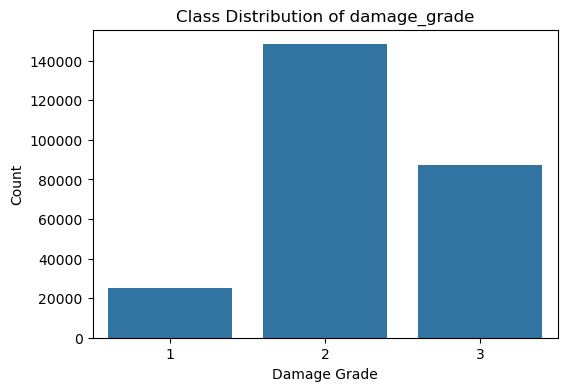

In [86]:
#Checking whether need to balance the data or not 

# Count occurrences of each class in damage_grade
print(data['damage_grade'].value_counts(normalize=True) * 100)  # Percentage distribution

# Plot class distribution
plt.figure(figsize=(6,4))
sns.countplot(x=data['damage_grade'])
plt.title("Class Distribution of damage_grade")
plt.xlabel("Damage Grade")
plt.ylabel("Count")
plt.show()

In [88]:
# Final feature set
X = data.drop('damage_grade', axis=1)  # Features
y = data['damage_grade']  # Target

In [90]:
# Spliting the data into train and test
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size=0.25,random_state=33)

In [92]:
# Transform the training data using the preprocessor object or PipeLine
processed_x_train = preprocessor.fit_transform(x_train)
processed_x_test = preprocessor.fit_transform(x_test)

In [94]:
#Balancing the data
from sklearn.utils.class_weight import compute_sample_weight
class_weights = {1: 1, 2: 5, 3: 10}  # Adjust weights based on class imbalance
# Compute sample weights
sample_weights = compute_sample_weight(class_weight=class_weights, y=y_train)

In [96]:
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

#### 1.Logistic Regression 

In [205]:
from sklearn.model_selection import GridSearchCV
log_param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],  # Regularization strength
    'solver': ['liblinear', 'lbfgs']  # Optimization algorithms
}
log_grid = GridSearchCV(LogisticRegression(class_weight='balanced', random_state=42), 
                        log_param_grid, cv=3, scoring='accuracy', n_jobs=-1, verbose=2)
log_grid.fit(processed_x_train, y_train)
print("Best Parameters for Logistic Regression:", log_grid.best_params_)

# Train final Logistic Regression model
best_log_model = LogisticRegression(**log_grid.best_params_, class_weight='balanced', random_state=42)
best_log_model.fit(processed_x_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best Parameters for Logistic Regression: {'C': 0.01, 'solver': 'liblinear'}


LogisticRegression(C=0.01, class_weight='balanced', random_state=42,
                   solver='liblinear')

In [207]:
# Train Logistic Regression with Best Parameters
best_log_model = LogisticRegression(C=0.01, solver='liblinear', class_weight='balanced', random_state=42)
best_log_model.fit(processed_x_train, y_train)

LogisticRegression(C=0.01, class_weight='balanced', random_state=42,
                   solver='liblinear')

In [208]:
y_predict = best_log_model.predict(processed_x_test)
y_predict

array([3, 2, 1, ..., 2, 2, 2], dtype=int64)

Logistic Regression Accuracy: 0.5513806388236558

 Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           1       0.40      0.60      0.48      6318
           2       0.60      0.73      0.66     37048
           3       0.48      0.24      0.32     21785

    accuracy                           0.55     65151
   macro avg       0.50      0.52      0.49     65151
weighted avg       0.54      0.55      0.53     65151



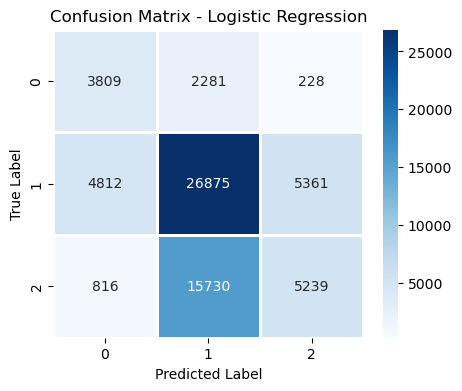

In [209]:
# Now, Evaluate Model Performance
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
# Calculate Accuracy
log_accuracy = accuracy_score(y_test, y_predict)
print("Logistic Regression Accuracy:", log_accuracy)
# Print Classification Report
print("\n Classification Report for Logistic Regression:")
print(classification_report(y_test, y_predict))
# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_predict), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Logistic Regression")
plt.show()

#### 2.Decision Tree

In [213]:
# Define parameter grid
param_grid = {
    'max_depth': [5, 10, 15, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 3, 5]
}
# Perform Grid Search
grid_search = GridSearchCV(DecisionTreeClassifier(class_weight="balanced", random_state=42),
                           param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)
grid_search.fit(processed_x_train, y_train)
# Get best parameters
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# Train the best Decision Tree model
best_dt_model = DecisionTreeClassifier(**best_params, class_weight="balanced", random_state=42)
best_dt_model.fit(processed_x_train, y_train)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best Parameters: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2}


DecisionTreeClassifier(class_weight='balanced', max_depth=20, random_state=42)

In [215]:
# Predict
y_pred_dt = best_dt_model.predict(processed_x_test)
y_pred_dt

array([3, 2, 1, ..., 3, 3, 1], dtype=int64)

 Decision Tree Accuracy: 0.51838037789136

 Classification Report for Decision Tree:
              precision    recall  f1-score   support

           1       0.35      0.51      0.42      6318
           2       0.64      0.50      0.56     37048
           3       0.45      0.55      0.50     21785

    accuracy                           0.52     65151
   macro avg       0.48      0.52      0.49     65151
weighted avg       0.55      0.52      0.52     65151



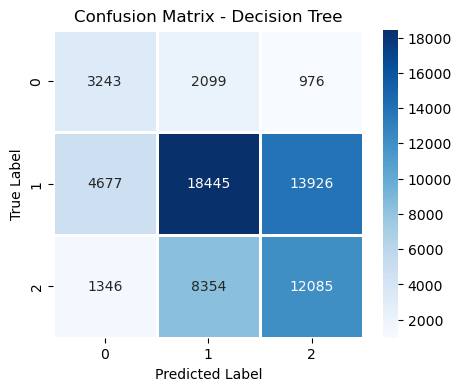

In [217]:
# Evaluate Decision Tree
dt_accuracy = accuracy_score(y_test, y_pred_dt)
print(" Decision Tree Accuracy:", dt_accuracy)
print("\n Classification Report for Decision Tree:")
print(classification_report(y_test, y_pred_dt))
# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_dt), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Decision Tree")
plt.show()

### 3.Random Forest

In [126]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define Hyperparameters for Random Forest
rf_param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Train Random Forest with GridSearchCV
rf_grid = GridSearchCV(RandomForestClassifier(class_weight='balanced', random_state=42),
                       rf_param_grid, cv=3, scoring='f1_weighted', n_jobs=-1, verbose=2)

# Fit Grid Search on training data
rf_grid.fit(processed_x_train,y_train)

# Best hyperparameters
print("Best Parameters for Random Forest:", rf_grid.best_params_)

Fitting 3 folds for each of 54 candidates, totalling 162 fits
Best Parameters for Random Forest: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}


In [127]:
# Predict
y_pred_rf = best_rf_model.predict(processed_x_test)
y_pred_rf

array([2, 2, 2, ..., 3, 3, 2], dtype=int64)

 Random Forest Accuracy: 0.6135439210449571

 Classification Report for Random Forest:
              precision    recall  f1-score   support

           1       0.53      0.38      0.45      6318
           2       0.65      0.74      0.69     37048
           3       0.55      0.46      0.50     21785

    accuracy                           0.61     65151
   macro avg       0.58      0.53      0.55     65151
weighted avg       0.60      0.61      0.61     65151



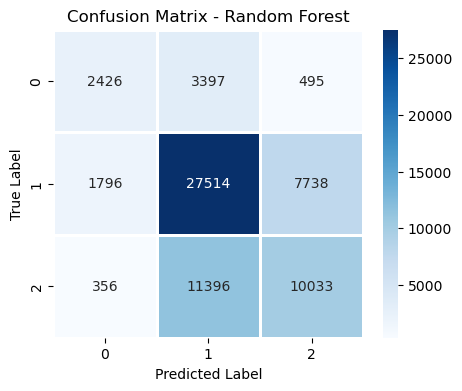

In [128]:
# Evaluate Random Forest
rf_accuracy = accuracy_score(y_test, y_pred_rf)
print(" Random Forest Accuracy:", rf_accuracy)
print("\n Classification Report for Random Forest:")
print(classification_report(y_test, y_pred_rf))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_rf), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Random Forest")
plt.show()

#### 4.Gradient Boosting

In [219]:
# Define Hyperparameters for Gradient Boosting
gb_param_grid = {
    'n_estimators': [50, 100],
    'learning_rate': [0.01, 0.1]
}
# Train Gradient Boosting with GridSearchCV
gb_grid = GridSearchCV(GradientBoostingClassifier(random_state=42),
                       gb_param_grid, cv=3, scoring='accuracy', n_jobs=-1, verbose=2)
gb_grid.fit(processed_x_train, y_train)
print("Best Parameters for Gradient Boosting:", gb_grid.best_params_)
# Train Final Gradient Boosting Model
best_gb_model = GradientBoostingClassifier(**gb_grid.best_params_, random_state=42)
best_gb_model.fit(processed_x_train, y_train)

Fitting 3 folds for each of 4 candidates, totalling 12 fits
Best Parameters for Gradient Boosting: {'learning_rate': 0.1, 'n_estimators': 100}


GradientBoostingClassifier(random_state=42)

In [220]:
# Predict
y_pred_gb = best_gb_model.predict(processed_x_test)
y_pred_gb

array([2, 2, 2, ..., 3, 2, 2], dtype=int64)

 Gradient Boosting Accuracy: 0.5953861030529078

 Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

           1       0.62      0.29      0.39      6318
           2       0.60      0.91      0.72     37048
           3       0.57      0.15      0.24     21785

    accuracy                           0.60     65151
   macro avg       0.59      0.45      0.45     65151
weighted avg       0.59      0.60      0.53     65151



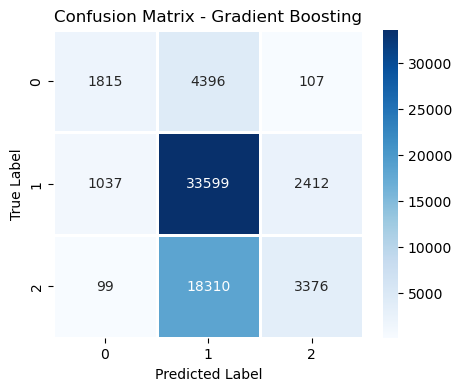

In [221]:
# Evaluate Gradient Boosting
gb_accuracy = accuracy_score(y_test, y_pred_gb)
print(" Gradient Boosting Accuracy:", gb_accuracy)
print("\n Classification Report for Gradient Boosting:")
print(classification_report(y_test, y_pred_gb))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_gb), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Gradient Boosting")
plt.show()

### 5.XGBoost

In [152]:
# Adjust class labels to start from 0
y_train_adj = y_train - y_train.min()
y_test_adj = y_test - y_test.min()

In [197]:
from xgboost import XGBClassifier
# Initializing XGBoost model
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric="mlogloss", random_state=42)

# Train the model using adjusted labels
xgb_model.fit(processed_x_train, y_train_adj, sample_weight=sample_weights)

# Predict on test set
y_pred_xgb = xgb_model.predict(processed_x_test)

# Convert predictions back to original labels
y_pred_xgb_original = y_pred_xgb + y_train.min()

In [199]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

# Define hyperparameter grid
xgb_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 6],
    'learning_rate': [0.01, 0.1],
    'subsample': [0.8],
    'colsample_bytree': [0.8]
}

# Initializing XGBoost model
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric="mlogloss", random_state=42)

#  3-fold cross-validation
xgb_grid = GridSearchCV(xgb_model, xgb_param_grid, cv=3, scoring='accuracy', n_jobs=-1, verbose=2)

# Fit 
xgb_grid.fit(processed_x_train, y_train_adj)

# Best parameters & model
print("Best Parameters for XGBoost:", xgb_grid.best_params_)
best_xgb_model = xgb_grid.best_estimator_

Fitting 3 folds for each of 8 candidates, totalling 24 fits
Best Parameters for XGBoost: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 200, 'subsample': 0.8}


In [201]:
# Predict on test set 
y_pred_xgb_tuned = best_xgb_model.predict(processed_x_test)
y_pred_xgb_tuned

array([1, 1, 1, ..., 2, 1, 1], dtype=int64)


 Tuned XGBoost Accuracy: 0.6302742858897024

 Classification Report for Tuned XGBoost:
              precision    recall  f1-score   support

           0       0.66      0.35      0.46      6318
           1       0.63      0.85      0.73     37048
           2       0.61      0.34      0.43     21785

    accuracy                           0.63     65151
   macro avg       0.63      0.51      0.54     65151
weighted avg       0.63      0.63      0.60     65151



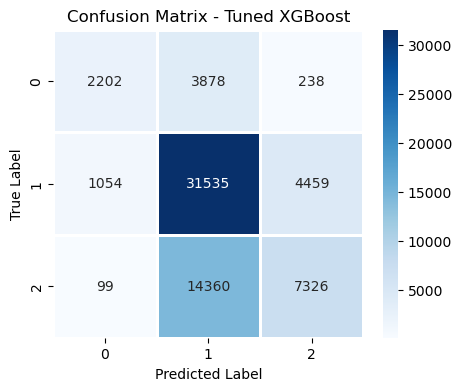

In [203]:
# Compute accuracy
xgb_tuned_acc = accuracy_score(y_test_adj, y_pred_xgb_tuned)
print("\n Tuned XGBoost Accuracy:", xgb_tuned_acc)

# Print classification report
print("\n Classification Report for Tuned XGBoost:")
print(classification_report(y_test_adj, y_pred_xgb_tuned))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test_adj, y_pred_xgb_tuned), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Tuned XGBoost")
plt.show()

### Model Comparision


📊 Model Performance Comparison:
XGBoost: 0.6294
Random Forest: 0.6135
Gradient Boosting: 0.5965
Logistic Regression: 0.5522
Decision Tree: 0.5216


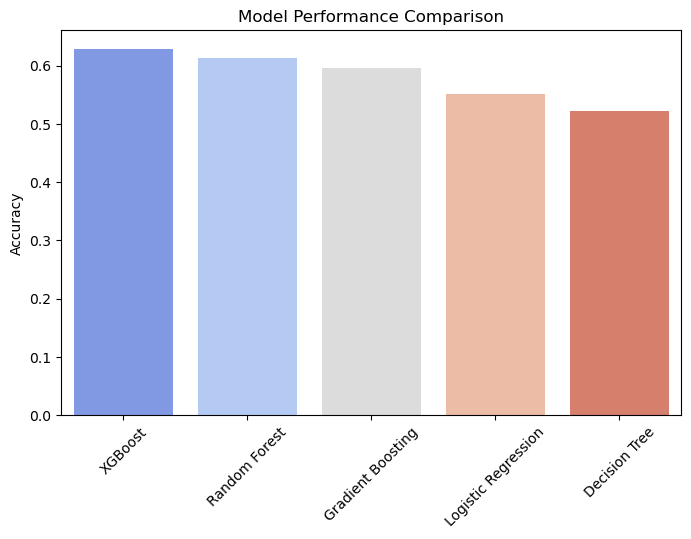

In [165]:
# Store model results
model_results = {
    "Logistic Regression": log_accuracy,
    "Decision Tree": dt_accuracy,
    "Random Forest": rf_accuracy,
    "Gradient Boosting": gb_accuracy,
    "XGBoost": xgb_tuned_acc
}

# Sort models by accuracy
sorted_results = sorted(model_results.items(), key=lambda x: x[1], reverse=True)
print("\n📊 Model Performance Comparison:")
for model, acc in sorted_results:
    print(f"{model}: {acc:.4f}")

# Plot Model Comparison
plt.figure(figsize=(8, 5))
sns.barplot(x=[m[0] for m in sorted_results], y=[m[1] for m in sorted_results], palette="coolwarm")
plt.xticks(rotation=45)
plt.ylabel("Accuracy")
plt.title("Model Performance Comparison")
plt.show()

### Feature Importance

In [175]:
# Extract feature importances from trained models
lr_feature_importance = abs(best_log_model.coef_[0])  #Logistic Regression
df_feature_importance = best_dt_model.feature_importances_  #Decision Tree
rf_feature_importance = best_rf_model.feature_importances_  # Random Forest
xgb_feature_importance = best_xgb_model.feature_importances_  # XGBoost
gb_feature_importance = best_gb_model.feature_importances_  # Gradient Boosting

# Verify extracted importance arrays
print("Logistic Regression Feature Importance Shape:", lr_feature_importance.shape)
print("Decision Tree Feature Importance Shape:", df_feature_importance.shape)
print("RandomForest Feature Importance Shape:", rf_feature_importance.shape)
print("XGBoost Feature Importance Shape:", xgb_feature_importance.shape)
print("GradientBoosting Feature Importance Shape:", gb_feature_importance.shape)

Logistic Regression Feature Importance Shape: (22,)
Decision Tree Feature Importance Shape: (22,)
RandomForest Feature Importance Shape: (22,)
XGBoost Feature Importance Shape: (22,)
GradientBoosting Feature Importance Shape: (22,)


In [177]:
# Extract feature names from the preprocessor
feature_names = []
for name, transformer, columns in preprocessor.transformers_:
    if hasattr(transformer, 'get_feature_names_out'):
        feature_names.extend(transformer.get_feature_names_out(columns))
    else:
        feature_names.extend(columns)  # Use original column names for passthrough

# Convert to NumPy array for consistency
feature_names = np.array(feature_names)

# Ensure feature names match processed_x_train (only first 19 features)
feature_names = feature_names[:processed_x_train.shape[1]]
print("Feature Names:", feature_names)
print("Number of Features:", len(feature_names))

Feature Names: ['geo_level_2_id' 'has_secondary_use_agriculture'
 'has_secondary_use_hotel' 'has_secondary_use_rental'
 'count_floors_pre_eq' 'age' 'area_percentage' 'height_percentage'
 'count_families' 'position' 'land_surface_condition' 'roof_type'
 'other_floor_type' 'foundation_type' 'ground_floor_type'
 'plan_configuration' 'legal_ownership_status'
 'has_superstructure_adobe_mud' 'has_superstructure_mud_mortar_stone'
 'has_superstructure_cement_mortar_brick'
 'has_superstructure_rc_non_engineered' 'has_superstructure_rc_engineered']
Number of Features: 22


In [187]:
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,  
    'LogisticRegression': lr_feature_importance,
    'DecisionTree' : df_feature_importance,
    'RandomForest': rf_feature_importance,
    'XGBoost': xgb_feature_importance,
    'GradientBoosting': gb_feature_importance
})

# Compute mean importance across models
feature_importance_df['MeanImportance'] = feature_importance_df[['LogisticRegression','DecisionTree','RandomForest', 'XGBoost', 'GradientBoosting']].mean(axis=1)

# Sort features by mean importance
feature_importance_df = feature_importance_df.sort_values(by="MeanImportance", ascending=False)

# Display top 5 most important features
print("Top Important Features:\n", feature_importance_df.head(22))

Top Important Features:
                                    Feature  LogisticRegression  DecisionTree  \
4                      count_floors_pre_eq            1.653002      0.028631   
18     has_superstructure_mud_mortar_stone            1.322933      0.037684   
17            has_superstructure_adobe_mud            1.361467      0.009398   
13                         foundation_type            0.377953      0.264579   
21        has_superstructure_rc_engineered            1.155175      0.001146   
0                           geo_level_2_id            0.051173      0.273506   
8                           count_families            0.735604      0.016877   
7                        height_percentage            0.381006      0.045970   
20    has_superstructure_rc_non_engineered            0.476331      0.005682   
5                                      age            0.196505      0.067248   
19  has_superstructure_cement_mortar_brick            0.265425      0.039069   
14             

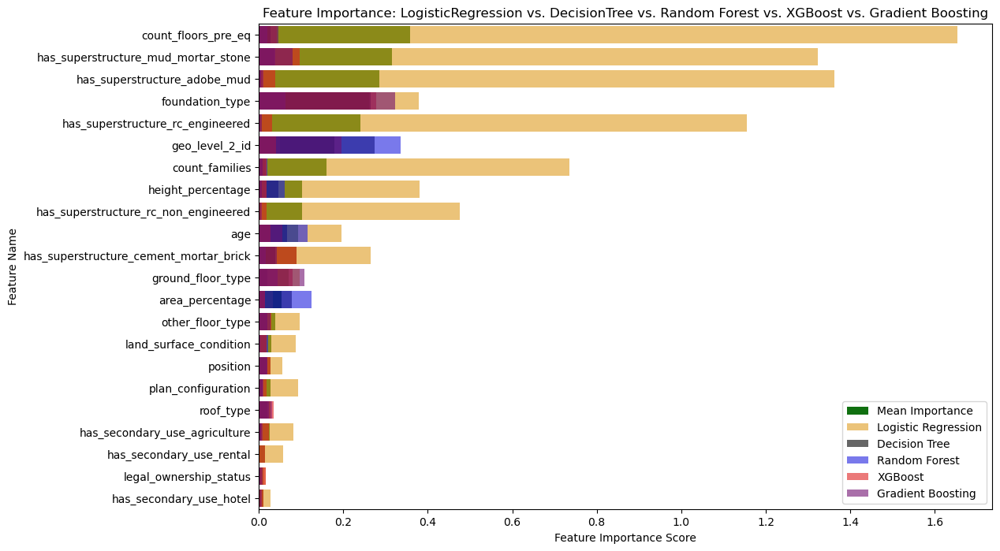

In [191]:
# Plot feature importance using Seaborn
plt.figure(figsize=(12, 8))
sns.barplot(x="MeanImportance", y="Feature", data=feature_importance_df, color='green', label="Mean Importance")
sns.barplot(x="LogisticRegression", y="Feature", data=feature_importance_df, color='orange', alpha=0.6, label="Logistic Regression")
sns.barplot(x="DecisionTree", y="Feature", data=feature_importance_df, color='black', alpha=0.6, label="Decision Tree")
sns.barplot(x="RandomForest", y="Feature", data=feature_importance_df, color='blue', alpha=0.6, label="Random Forest")
sns.barplot(x="XGBoost", y="Feature", data=feature_importance_df, color='red', alpha=0.6, label="XGBoost")
sns.barplot(x="GradientBoosting", y="Feature", data=feature_importance_df, color='purple', alpha=0.6, label="Gradient Boosting")

plt.xlabel("Feature Importance Score")
plt.ylabel("Feature Name")
plt.title("Feature Importance: LogisticRegression vs. DecisionTree vs. Random Forest vs. XGBoost vs. Gradient Boosting")
plt.legend()
plt.show()

In [195]:
#Dropping the features with low importance to improve accuracy 

# Convert NumPy arrays to DataFrames (if they aren't already)
processed_x_train_df = pd.DataFrame(processed_x_train, columns=feature_names)
processed_x_test_df = pd.DataFrame(processed_x_test, columns=feature_names)

# Define threshold for dropping features
importance_threshold = 0.02  # Adjust as needed

# Identify least important features
least_important_features = feature_importance_df[feature_importance_df['MeanImportance'] < importance_threshold]['Feature'].tolist()

# Drop features
processed_x_train_df = processed_x_train_df.drop(columns=least_important_features, errors='ignore')
processed_x_test_df = processed_x_test_df.drop(columns=least_important_features, errors='ignore')

# Convert back to NumPy arrays if needed for model training
processed_x_train = processed_x_train_df.values
processed_x_test = processed_x_test_df.values

print(f"Dropped {len(least_important_features)} features: {least_important_features}")


Dropped 3 features: ['has_secondary_use_rental', 'legal_ownership_status', 'has_secondary_use_hotel']


In [225]:
#Due to Less accuracy trying on with the combination of models
from sklearn.ensemble import StackingClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

base_models = [
    ('rf', RandomForestClassifier(n_estimators=100, random_state=42)),
    ('xgb', XGBClassifier(n_estimators=100, random_state=42))
]

stacking_model = StackingClassifier(
    estimators=base_models,
    final_estimator=LogisticRegression(),
    cv=3
)

stacking_model.fit(processed_x_train, y_train)
print("Stacking Model Accuracy:", stacking_model.score(processed_x_test, y_test))

Stacking Model Accuracy: 0.6411413485595002
